# Домашнее задание "Варианционные автоэнкодеры"

В этом домашнем задании вам предстоит реализовать несколько версий автоэнкодера для работы с изображениями.

Вы научитесь добавлять улыбку на фотографии людей, изменяя их исходное выражение лица с помощью обученной модели. А также, обучите ваш автоэнкодер генерировать изображения рукописных цифр.

# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (1 балл)


Перед тем, как начинать работу с моделями нужно подготовить данные.

In [1]:
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
import matplotlib.pyplot as plt

import os
import pandas as pd
import skimage.io
from skimage.transform import resize

import imageio
from PIL import Image
import kagglehub

%matplotlib inline

В этом задании вам предстоить работать с датасетом [LFW (Labeled Faces in the Wild)](https://datasets.activeloop.ai/docs/ml/datasets/lfw-dataset/#:~:text=What%20is%20LFW%20Dataset%3F,commercial%20algorithms%20prior%20to%20release).

In [2]:
# Скачиваем картинки
images_path = kagglehub.dataset_download("jessicali9530/lfw-dataset")
print("Path to dataset files:", images_path)

Path to dataset files: /kaggle/input/datasets/jessicali9530/lfw-dataset


In [3]:
# Скачиваем атрибуты
attrs_path = kagglehub.dataset_download("averkij/lfw-attributes")
print("Path to dataset files:", attrs_path)

Path to dataset files: /kaggle/input/datasets/averkij/lfw-attributes


In [4]:
DATASET_PATH = "/kaggle/input/datasets/jessicali9530/lfw-dataset"
ATTRIBUTES_PATH = "/kaggle/input/datasets/averkij/lfw-attributes/lfw_attributes.txt"

In [5]:
def fetch_dataset(dx=80, dy=80, dimx=45, dimy=45):

    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='\t', skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:, :-1].values, columns = df_attrs.columns[1:])

    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath, fname)
                photo_id = fname[:-4].replace('_', ' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person': person_id,'imagenum': photo_number, 'photo_path': fpath})

    photo_ids = pd.DataFrame(photo_ids)
    df = pd.merge(df_attrs,photo_ids,on=('person', 'imagenum'))

    assert len(df) == len(df_attrs), "Потеряны данные при объединении датафреймов!"

    images = df['photo_path'].apply(imageio.imread)\
                                .apply(lambda img:img[dy:-dy, dx:-dx])\
                                .apply(lambda img: np.array(Image.fromarray(img).resize([dimx, dimy])) )

    images = np.stack(images.values).astype('uint8')
    attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    # Преобразуем все значения в числа (строки, которые не могут быть числами, заменятся на NaN, потом заполним нулями)
    attrs = attrs.apply(pd.to_numeric, errors='coerce').fillna(0).astype('float32')
    
    return images, attrs

In [6]:
# Обратите внимание, что датасет представляет собой не только картинки, но и атрибуты
# Атрибуты понадобятся в конце этого задания

images, attrs = fetch_dataset()


Разбейте датасет изображений и атрибутов на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

In [7]:
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader

Картинок в Train: (10514, 45, 45, 3), атрибутов в Train: (10514, 73)
Картинок в Val: (2629, 45, 45, 3), атрибутов в Val: (2629, 73)


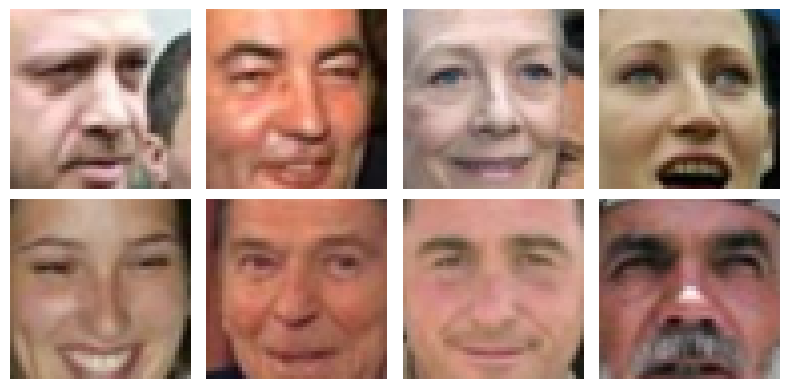

X_train shape: torch.Size([10514, 3, 45, 45])
y_train shape: torch.Size([10514, 73])


In [8]:
images_train, images_val, attrs_train, attrs_val = train_test_split(
    images, attrs, test_size=0.2, random_state=42, shuffle=True)

print(f"Картинок в Train: {images_train.shape}, атрибутов в Train: {attrs_train.shape}")
print(f"Картинок в Val: {images_val.shape}, атрибутов в Val: {attrs_val.shape}")

# Визуализация нескольких картинок из обучающей выборки
def show_images(images, n_rows=2, n_cols=4):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
            ax.axis('off')
    plt.tight_layout()
    plt.show()

show_images(images_train, n_rows=2, n_cols=4)

# Преобразование картинок в тензоры PyTorch
def numpy_to_torch(images):
    tensor = torch.from_numpy(images).permute(0, 3, 1, 2).float() / 255.0
    return tensor

X_train = numpy_to_torch(images_train)
X_val = numpy_to_torch(images_val)

# Атрибуты уже числа - переводим сразу
y_train = torch.tensor(attrs_train.values, dtype=torch.float32)
y_val = torch.tensor(attrs_val.values, dtype=torch.float32)

print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

# DataLoader'ы
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## 1.2. Архитектура модели (2 балла)
В этом разделе вы напишите и обучите обычный автоэнкодер.



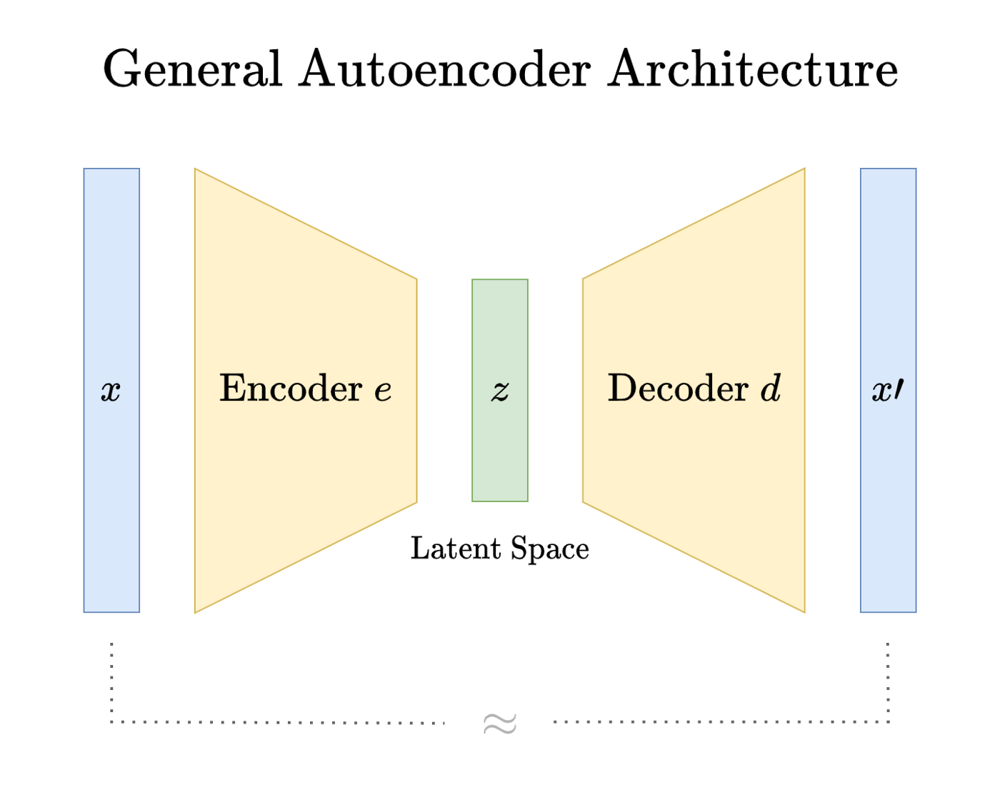

In [9]:
dim_code = 128

Реализуем autoencoder. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Экспериментируйте!

In [10]:
class Autoencoder(nn.Module):
    def __init__(self, code_dim=128):
        super().__init__()
        # Энкодер
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(128 * 6 * 6, code_dim),
            nn.ReLU()
        )
        # Декодер
        self.decoder = nn.Sequential(
            nn.Linear(code_dim, 128 * 6 * 6),
            nn.ReLU(),
            nn.Unflatten(1, (128, 6, 6)),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 3, stride=2, padding=1, output_padding=0),
            nn.Sigmoid()
        )

    def forward(self, x):
        latent_code = self.encoder(x)
        reconstruction = self.decoder(latent_code)
        return reconstruction, latent_code

In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = Autoencoder(code_dim=dim_code).to(device)
criterion = nn.MSELoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001)

## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэнкодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

Эпоха 1/30 | Train loss: 0.017665 | Val loss: 0.009134


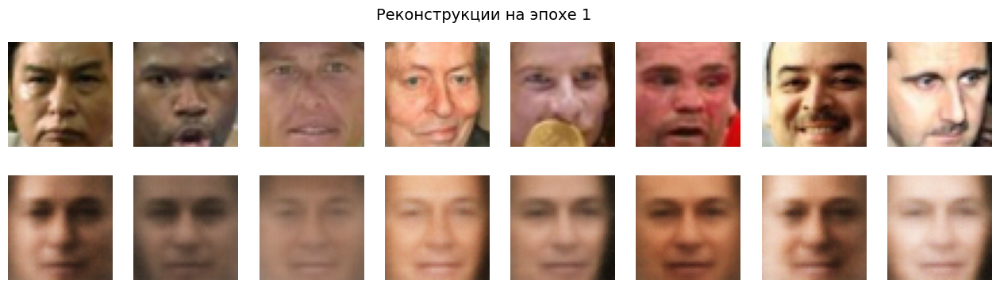

Эпоха 2/30 | Train loss: 0.007782 | Val loss: 0.007157


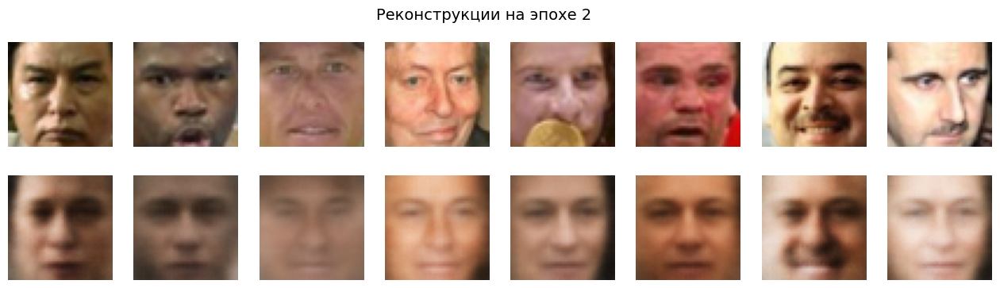

Эпоха 3/30 | Train loss: 0.006274 | Val loss: 0.006204


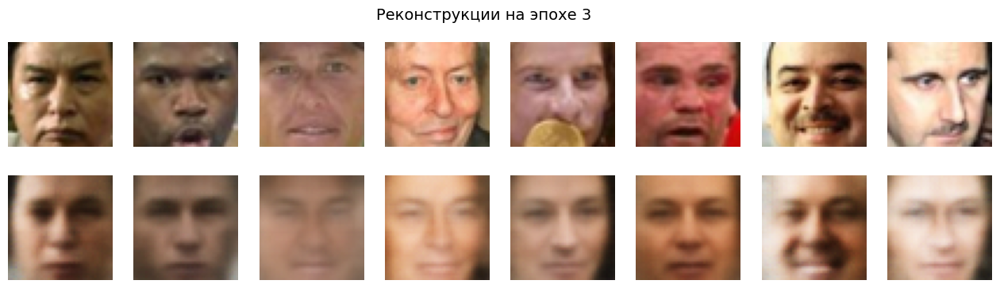

Эпоха 4/30 | Train loss: 0.005543 | Val loss: 0.005414


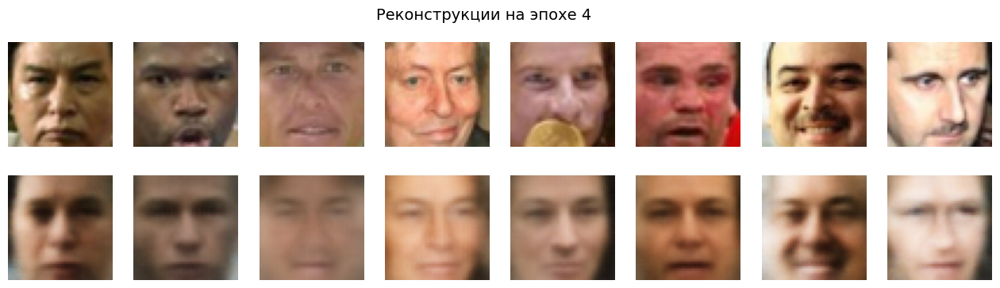

Эпоха 5/30 | Train loss: 0.005137 | Val loss: 0.005061


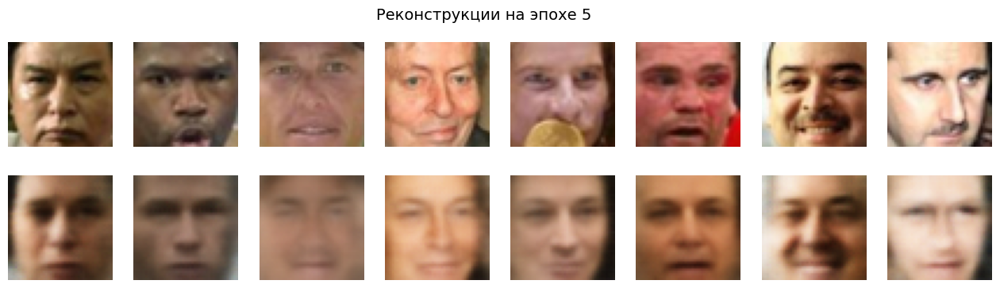

Эпоха 6/30 | Train loss: 0.004901 | Val loss: 0.004900


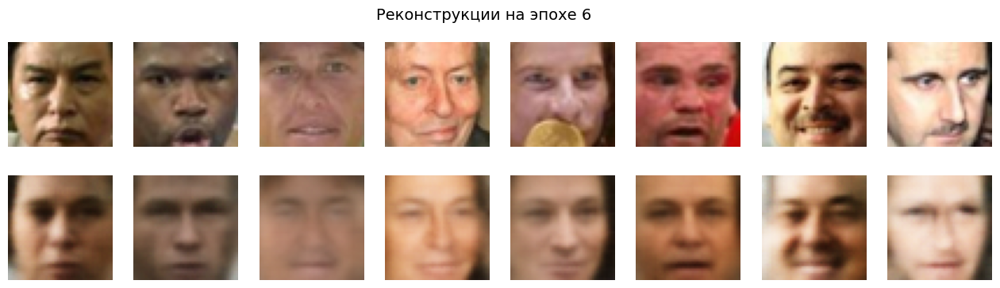

Эпоха 7/30 | Train loss: 0.004757 | Val loss: 0.004793


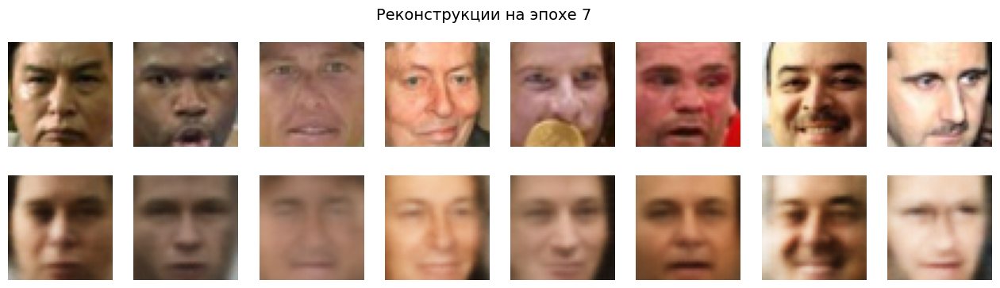

Эпоха 8/30 | Train loss: 0.004649 | Val loss: 0.004680


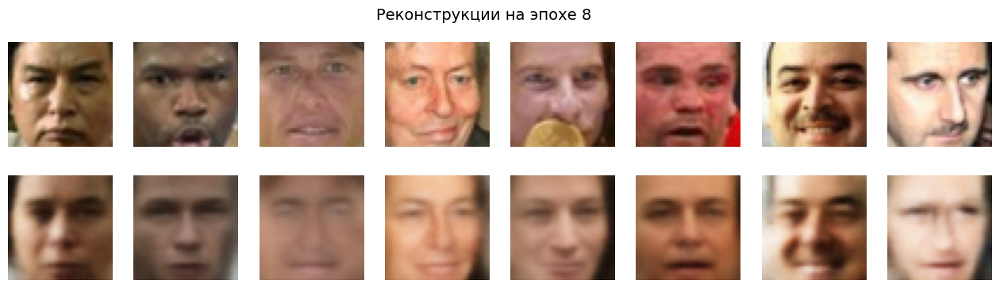

Эпоха 9/30 | Train loss: 0.004563 | Val loss: 0.004723


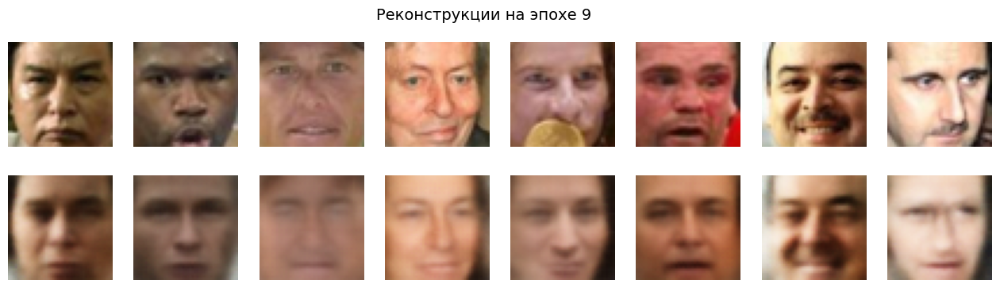

Эпоха 10/30 | Train loss: 0.004511 | Val loss: 0.004606


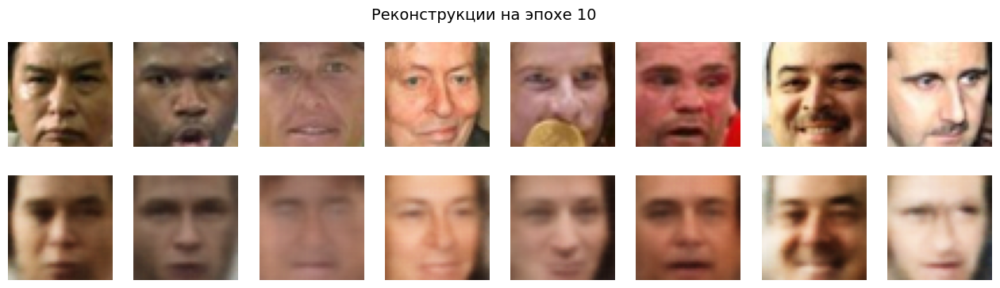

Эпоха 11/30 | Train loss: 0.004408 | Val loss: 0.004433


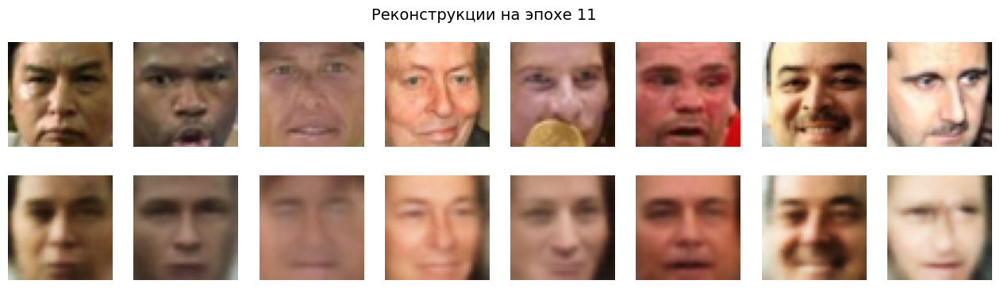

Эпоха 12/30 | Train loss: 0.004311 | Val loss: 0.004403


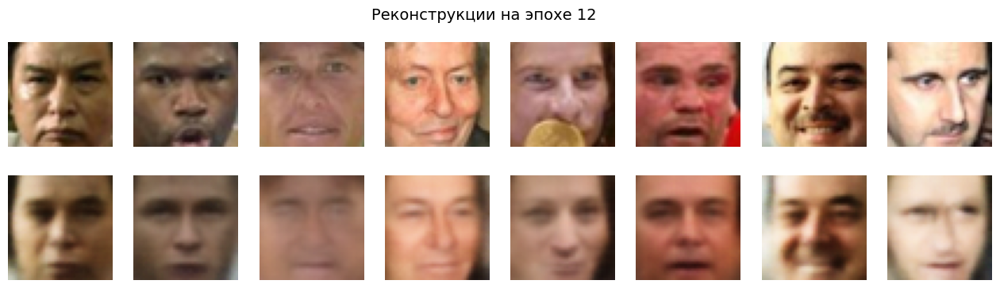

Эпоха 13/30 | Train loss: 0.004210 | Val loss: 0.004379


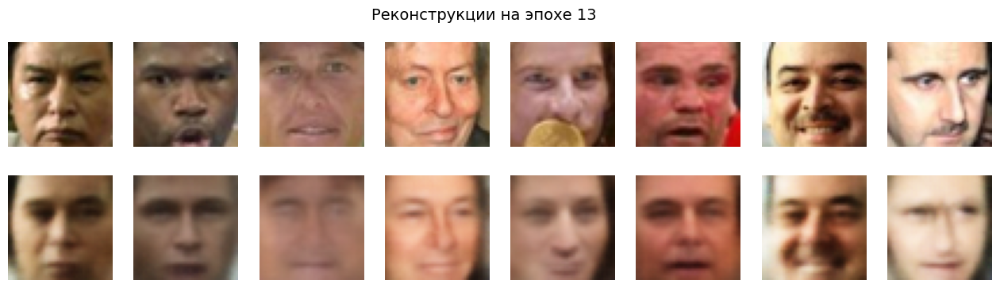

Эпоха 14/30 | Train loss: 0.004197 | Val loss: 0.004355


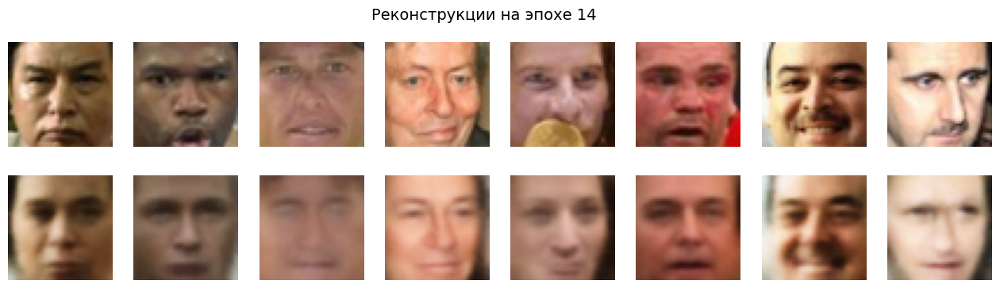

Эпоха 15/30 | Train loss: 0.004158 | Val loss: 0.004307


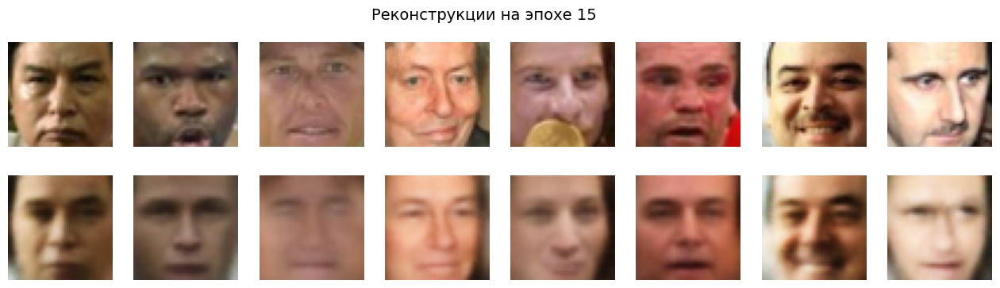

Эпоха 16/30 | Train loss: 0.004125 | Val loss: 0.004345


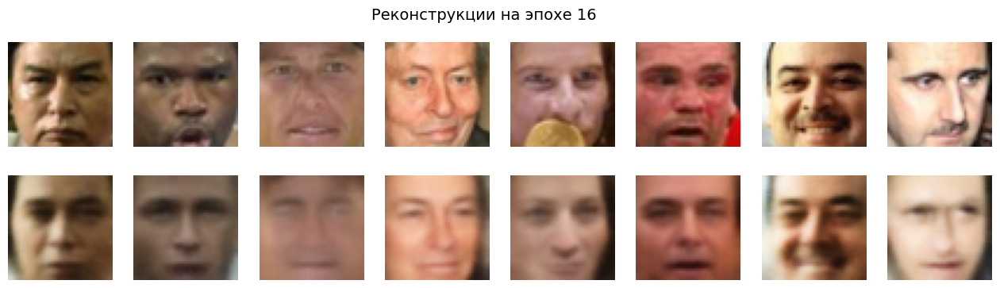

Эпоха 17/30 | Train loss: 0.004104 | Val loss: 0.004338


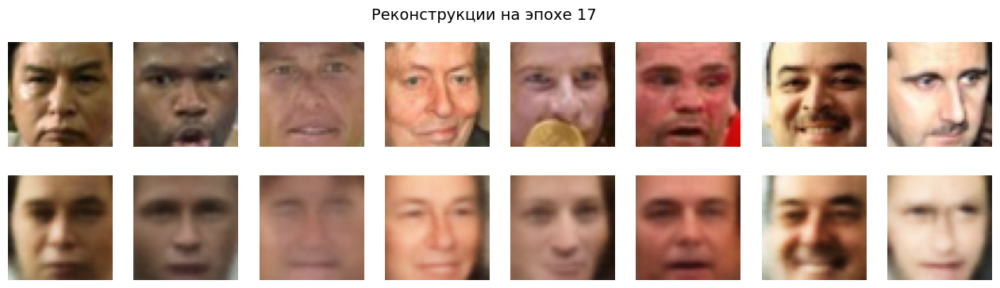

Эпоха 18/30 | Train loss: 0.004066 | Val loss: 0.004369


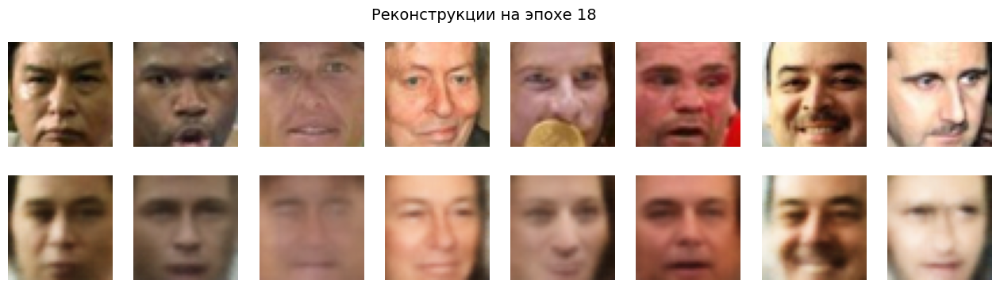

Эпоха 19/30 | Train loss: 0.004028 | Val loss: 0.004316


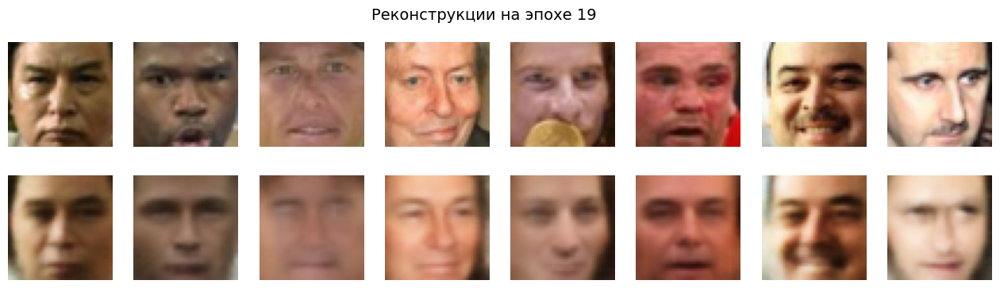

Эпоха 20/30 | Train loss: 0.004018 | Val loss: 0.004299


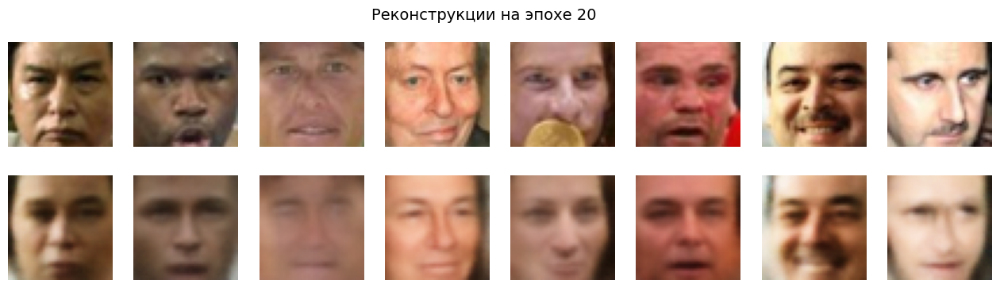

Эпоха 21/30 | Train loss: 0.003993 | Val loss: 0.004206


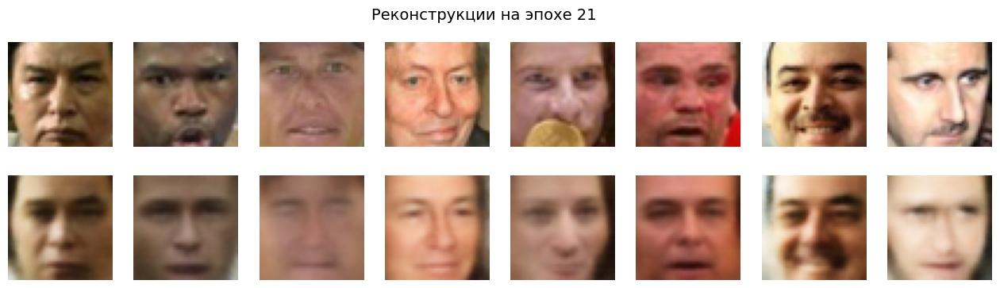

Эпоха 22/30 | Train loss: 0.003986 | Val loss: 0.004224


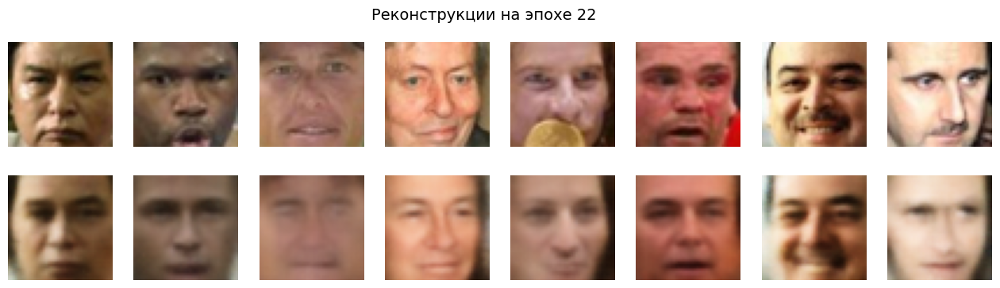

Эпоха 23/30 | Train loss: 0.003958 | Val loss: 0.004221


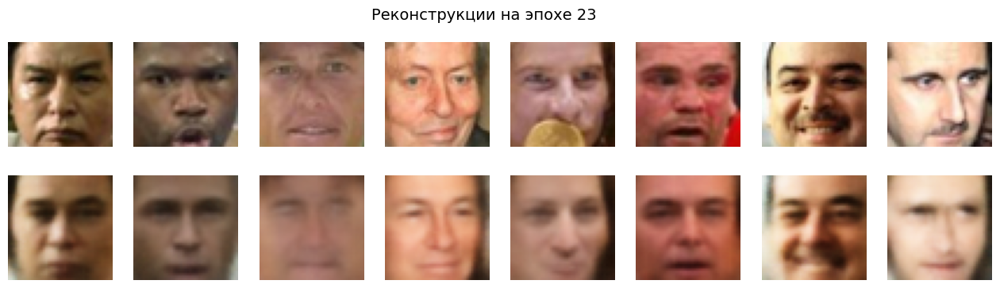

Эпоха 24/30 | Train loss: 0.003940 | Val loss: 0.004537


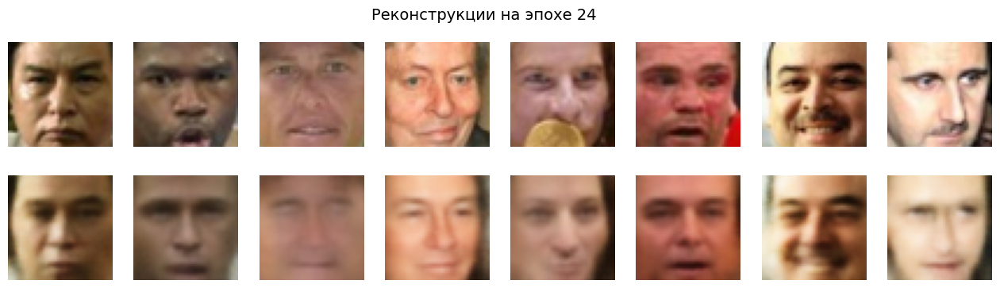

Эпоха 25/30 | Train loss: 0.003912 | Val loss: 0.004191


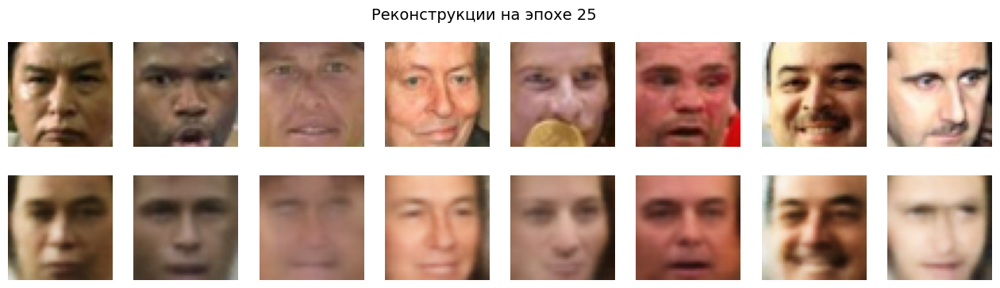

Эпоха 26/30 | Train loss: 0.003899 | Val loss: 0.004188


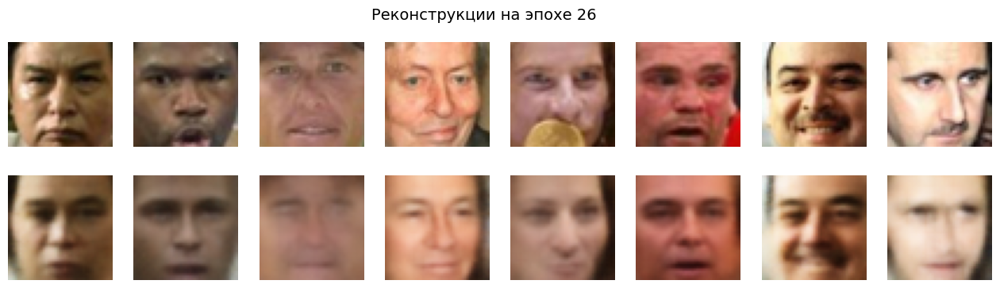

Эпоха 27/30 | Train loss: 0.003873 | Val loss: 0.004194


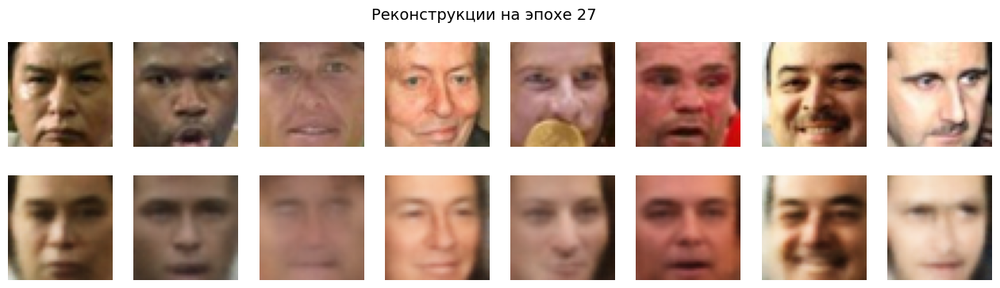

Эпоха 28/30 | Train loss: 0.003868 | Val loss: 0.004161


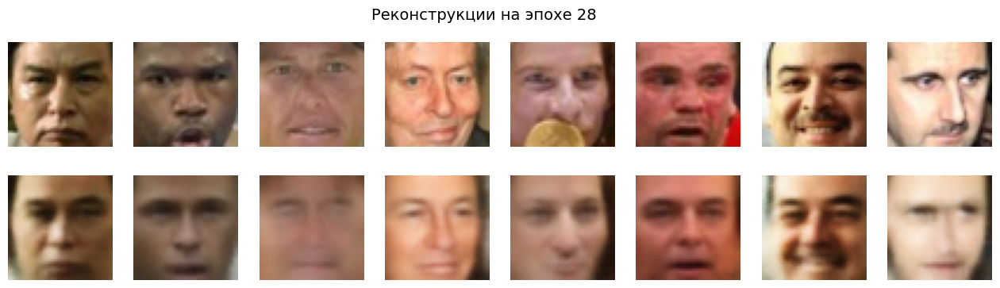

Эпоха 29/30 | Train loss: 0.003841 | Val loss: 0.004130


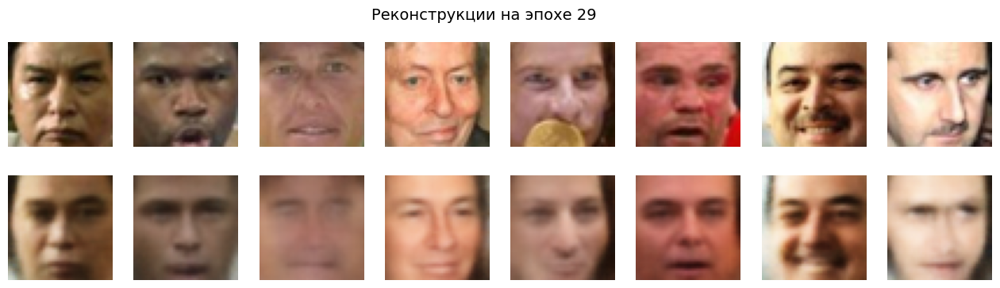

Эпоха 30/30 | Train loss: 0.003836 | Val loss: 0.004144


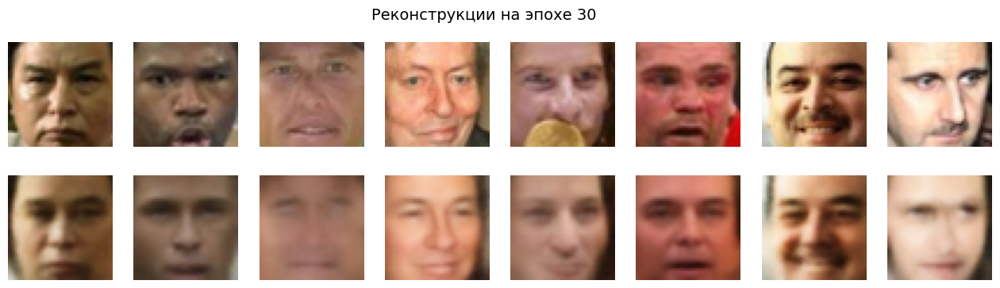

In [12]:
indices = torch.randperm(len(val_dataset))[:8]
val_samples = torch.stack([val_dataset[i][0] for i in indices]).to(device)

def show_reconstructions(model, samples, epoch):
    model.eval()
    with torch.no_grad():
        reconstruction, _ = model(samples)
    samples = samples.cpu()
    reconstruction = reconstruction.cpu()

    fig, axes = plt.subplots(2, 8, figsize=(16, 4))
    for i in range(8):
        # Оригинал
        axes[0, i].imshow(samples[i].permute(1,2,0).numpy())
        axes[0, i].axis('off')
        # Реконструкция
        axes[1, i].imshow(reconstruction[i].permute(1,2,0).numpy())
        axes[1, i].axis('off')
    axes[0,0].set_ylabel('Оригинал', size=12)
    axes[1,0].set_ylabel('Реконструкция', size=12)
    plt.suptitle(f'Реконструкции на эпохе {epoch}', fontsize=14)
    plt.show()

# Цикл обучения
epochs = 30
for epoch in range(epochs):
    model.train()
    train_loss = 0.0
    for batch_x, _ in train_loader:
        batch_x = batch_x.to(device)
        optimizer.zero_grad()
        reconstruction, latent_code = model(batch_x)
        loss = criterion(reconstruction, batch_x)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * batch_x.size(0)
    train_loss /= len(train_loader.dataset)

    # Валидация
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_x, _ in val_loader:
            batch_x = batch_x.to(device)
            reconstruction, _ = model(batch_x)
            loss = criterion(reconstruction, batch_x)
            val_loss += loss.item() * batch_x.size(0)
    val_loss /= len(val_loader.dataset)

    print(f"Эпоха {epoch+1}/{epochs} | Train loss: {train_loss:.6f} | Val loss: {val_loss:.6f}")

    # Визуализация реконструкций после каждой эпохи
    show_reconstructions(model, val_samples, epoch+1)

Что вы можете сказать про результат?

#### Картинки после реконструкции:
#### 1. +- узнаваемы (понятно, чьё лицо);
#### 2. Без сильных артефактов (например, ярких пятен, полос);
#### 3. Без коллапса, когда автоэнкодер выдаёт одно и то же усреднённое лицо для всех входов.

#### Результат удовлетворительный.

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэнкодер и получать реконструкцию, а попробуем создать что-то НОВОЕ!

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__ Если вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

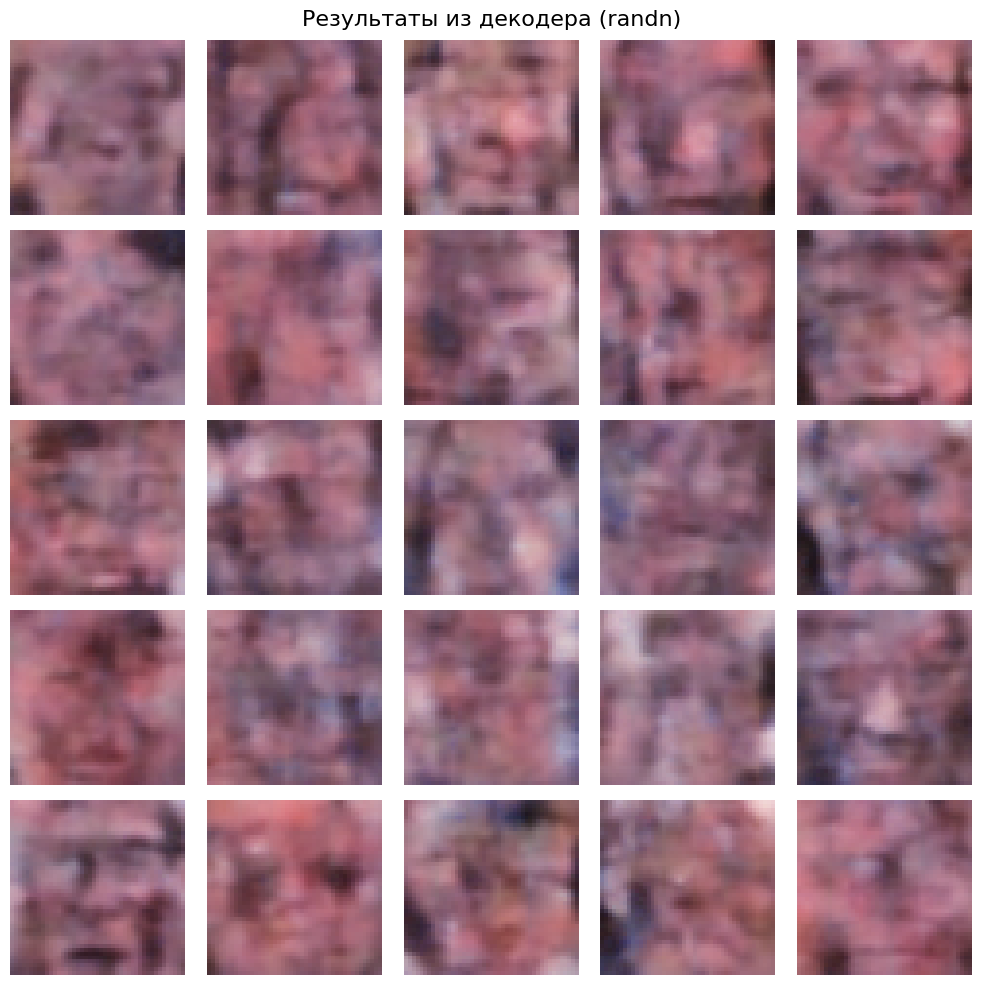

In [14]:
latent_dim = dim_code

# Генерируем 25 случайных векторов из стандартного нормального распределения
z = np.random.randn(25, latent_dim).astype('float32')
z_tensor = torch.tensor(z).to(device)

# Подаём декодеру
model.eval()
with torch.no_grad():
    generated = model.decoder(z_tensor)

generated_np = generated.cpu().permute(0, 2, 3, 1).numpy()

# Выводим картинки 5 на 5
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated_np[i])
    ax.axis('off')
plt.suptitle('Результаты из декодера (randn)', fontsize=16)
plt.tight_layout()
plt.show()

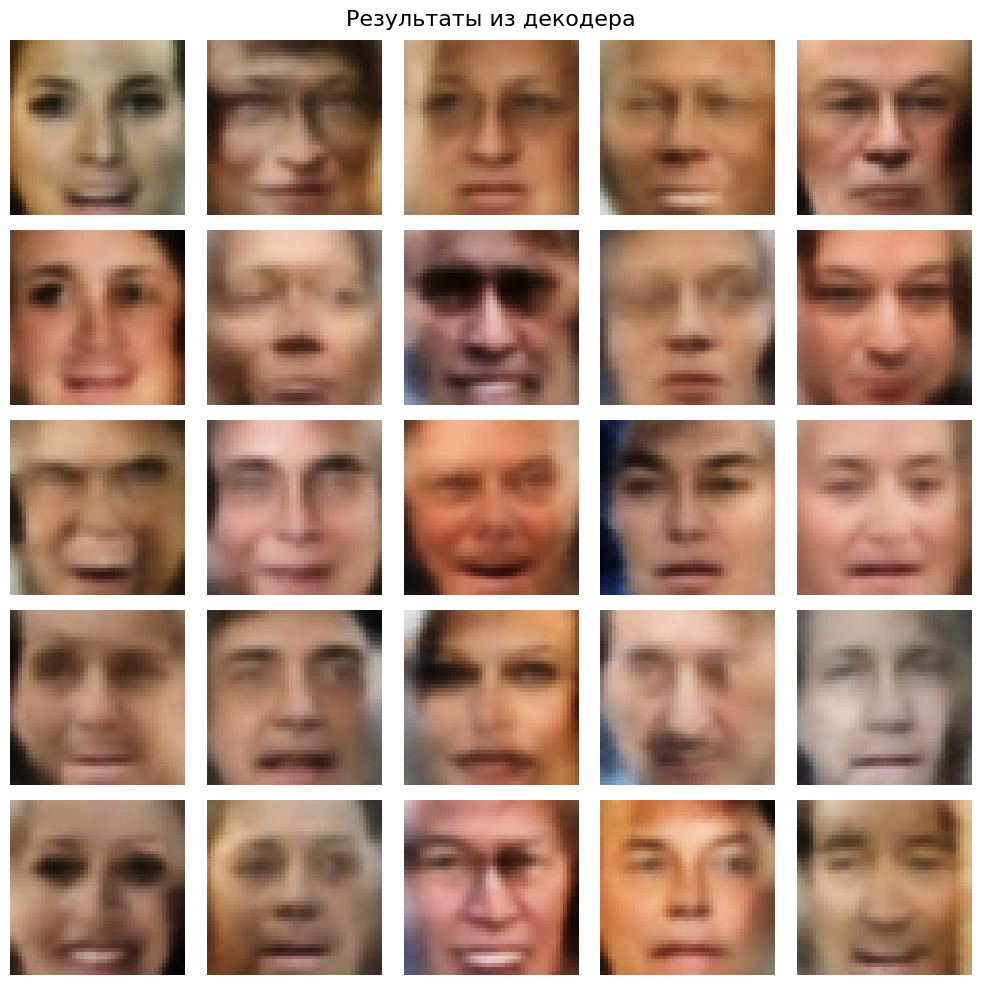

In [16]:
# Код по подсказке
# Собираем латентные представления всех train-изображений
all_latents = []
model.eval()
with torch.no_grad():
    for batch_x, _ in train_loader:
        batch_x = batch_x.to(device)
        _, code = model(batch_x)
        all_latents.append(code.cpu().numpy())

all_latents = np.concatenate(all_latents, axis=0)
mu = all_latents.mean(axis=0)
sigma = all_latents.std(axis=0)

# Генерируем с такими же средним и std
z = np.random.randn(25, latent_dim).astype('float32') * sigma + mu
z_tensor = torch.tensor(z).to(device)

# Подаём декодеру
model.eval()
with torch.no_grad():
    generated = model.decoder(z_tensor)

generated_np = generated.cpu().permute(0, 2, 3, 1).numpy()

# Выводим картинки 5 на 5
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated_np[i])
    ax.axis('off')
plt.suptitle('Результаты из декодера', fontsize=16)
plt.tight_layout()
plt.show()

## 1.5 Time to make fun! (3 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с атрибутами, скачанный вместе с картинками. В нем указаны имена изображений и присутствубщие атрибуты (улыбки, очки и прочее интересное).

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких.

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей.

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

Улыбающихся: 5432, Неулыбающихся: 7711


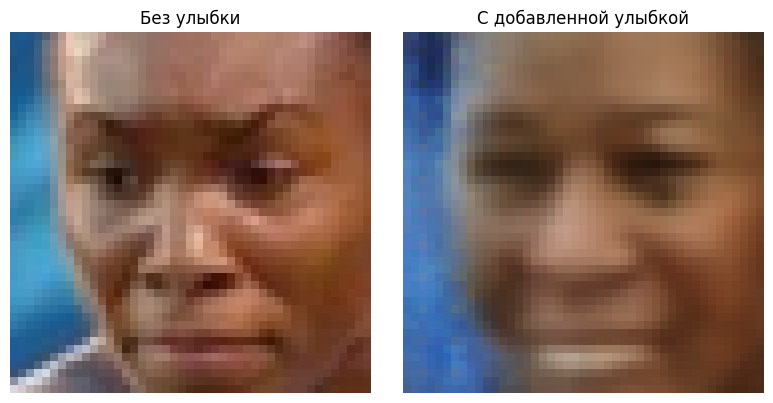

In [23]:
smile_mask = attrs['Smiling'] > 0
no_smile_mask = attrs['Smiling'] < 0

smile_indices = np.where(smile_mask)[0]
no_smile_indices = np.where(no_smile_mask)[0]

print(f"Улыбающихся: {len(smile_indices)}, Неулыбающихся: {len(no_smile_indices)}")

# Выбираем по 15 случайных примеров
n = 15
smile_sel = np.random.choice(smile_indices, size=min(n, len(smile_indices)), replace=False)
no_smile_sel = np.random.choice(no_smile_indices, size=min(n, len(no_smile_indices)), replace=False)

# Функция для получения латентных векторов через энкодер
def get_latent_codes(indices):
    imgs = images[indices]
    tensor = torch.from_numpy(imgs).permute(0, 3, 1, 2).float() / 255.0
    tensor = tensor.to(device)
    model.eval()
    with torch.no_grad():
        codes = model.encoder(tensor)
    return codes.cpu().numpy()

latent_smile = get_latent_codes(smile_sel)
latent_no_smile = get_latent_codes(no_smile_sel)

# Вычисляем вектор улыбки
mean_smile = latent_smile.mean(axis=0)
mean_no_smile = latent_no_smile.mean(axis=0)
smile_vector = mean_smile - mean_no_smile

# Применяем к одному конкретному неулыбающемуся изображению
idx_demo = no_smile_sel[0]
orig_img = images[idx_demo]
orig_tensor = torch.from_numpy(orig_img).permute(2, 0, 1).float() / 255.0
orig_tensor = orig_tensor.unsqueeze(0).to(device)

model.eval()
with torch.no_grad():
    code_orig = model.encoder(orig_tensor)
    code_smiled = code_orig + torch.tensor(smile_vector, device=device).float()
    img_smiled = model.decoder(code_smiled)

# Переводим в numpy для отрисовки
orig_np = orig_tensor.cpu().squeeze().permute(1, 2, 0).numpy()
smiled_np = img_smiled.cpu().squeeze().permute(1, 2, 0).numpy()

# Визуализация
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(orig_np)
axes[0].set_title('Без улыбки')
axes[0].axis('off')
axes[1].imshow(smiled_np)
axes[1].set_title('С добавленной улыбкой')
axes[1].axis('off')
plt.tight_layout()
plt.show()

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... В общем, все, на что хватит фантазии и на что есть атрибуты в `attrs`:)

# Часть 2: Variational Autoencoder (10 баллов)

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [26]:
from torchvision import transforms

In [27]:
batch_size = 32
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

100%|██████████| 9.91M/9.91M [00:00<00:00, 58.0MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.64MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 13.5MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 10.2MB/s]


## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

In [46]:
class VAE(nn.Module):
    def __init__(self, latent_dim=20):
        super().__init__()
        # Энкодер
        self.encoder_conv = nn.Sequential(
            nn.Conv2d(1, 32, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten()
        )
        self.fc_mu = nn.Linear(128 * 4 * 4, latent_dim)
        self.fc_logsigma = nn.Linear(128 * 4 * 4, latent_dim)

        # Декодер
        self.decoder_fc = nn.Linear(latent_dim, 128 * 4 * 4)
        self.decoder_conv = nn.Sequential(
            nn.Unflatten(1, (128, 4, 4)),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def encode(self, x):
        h = self.encoder_conv(x)
        return self.fc_mu(h), self.fc_logsigma(h)

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            sigma = torch.exp(logsigma)
            eps = torch.randn_like(mu)
            return mu + sigma * eps
        return mu

    def decode(self, z):
        return self.decoder_conv(self.decoder_fc(z))

    def forward(self, x):
        mu, logsigma = self.encode(x)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z)
        return mu, logsigma, reconstruction

Определим лосс и его компоненты для VAE:

Надеюсь, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [47]:
def KL_divergence(mu, logsigma):
    kl = -0.5 * torch.sum(1 + 2 * logsigma - mu.pow(2) - (2 * logsigma).exp(), dim=1)
    return kl.mean()

def log_likelihood(x, reconstruction):
    BCE = F.binary_cross_entropy(reconstruction, x, reduction='sum') / x.size(0)
    return BCE

def loss_vae(x, mu, logsigma, reconstruction):
    kl = KL_divergence(mu, logsigma)
    bce = log_likelihood(x, reconstruction)
    return bce + kl

И обучим модель:

In [48]:
latent_dim = 20
model = VAE(latent_dim=latent_dim).to(device)
optimizer = optim.AdamW(model.parameters(), lr=1e-3)

Эпоха 1/30 | Train loss: 128.325317 | Val loss: 99.269514
Эпоха 2/30 | Train loss: 105.548937 | Val loss: 94.429433
Эпоха 3/30 | Train loss: 103.392096 | Val loss: 93.719803
Эпоха 4/30 | Train loss: 102.251920 | Val loss: 92.125459
Эпоха 5/30 | Train loss: 101.306543 | Val loss: 93.414241


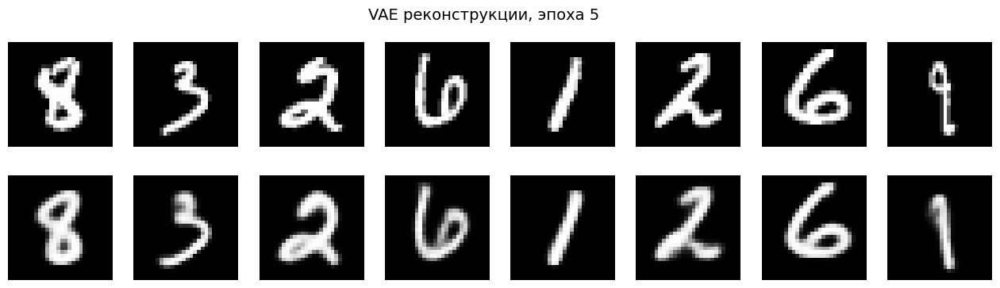

Эпоха 6/30 | Train loss: 100.732568 | Val loss: 91.548810
Эпоха 7/30 | Train loss: 100.212967 | Val loss: 91.839098
Эпоха 8/30 | Train loss: 99.751069 | Val loss: 91.184988
Эпоха 9/30 | Train loss: 99.459455 | Val loss: 91.201476
Эпоха 10/30 | Train loss: 99.157369 | Val loss: 91.705423


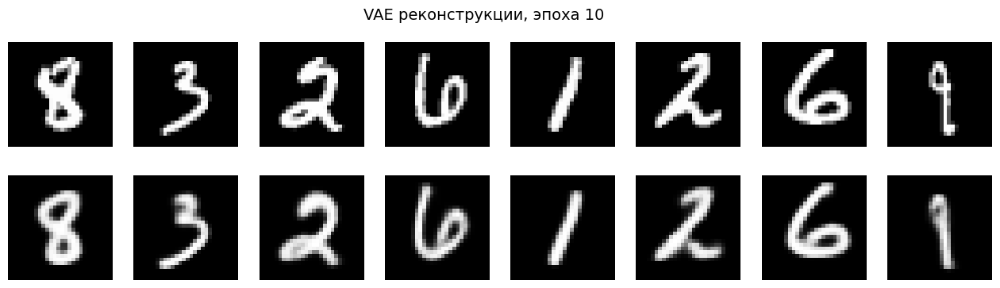

Эпоха 11/30 | Train loss: 98.896717 | Val loss: 91.029676
Эпоха 12/30 | Train loss: 98.663344 | Val loss: 90.414905
Эпоха 13/30 | Train loss: 98.439232 | Val loss: 90.159880
Эпоха 14/30 | Train loss: 98.280785 | Val loss: 89.425581
Эпоха 15/30 | Train loss: 98.039773 | Val loss: 90.081921


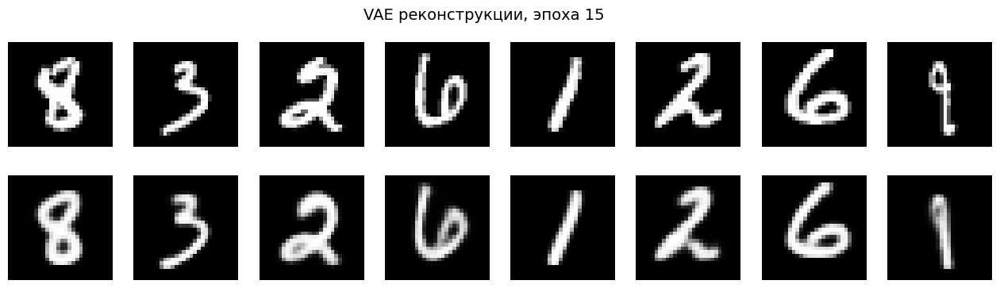

Эпоха 16/30 | Train loss: 97.943325 | Val loss: 89.848891
Эпоха 17/30 | Train loss: 97.788719 | Val loss: 89.739740
Эпоха 18/30 | Train loss: 97.602494 | Val loss: 89.868650
Эпоха 19/30 | Train loss: 97.524634 | Val loss: 90.029745
Эпоха 20/30 | Train loss: 97.370232 | Val loss: 89.983221


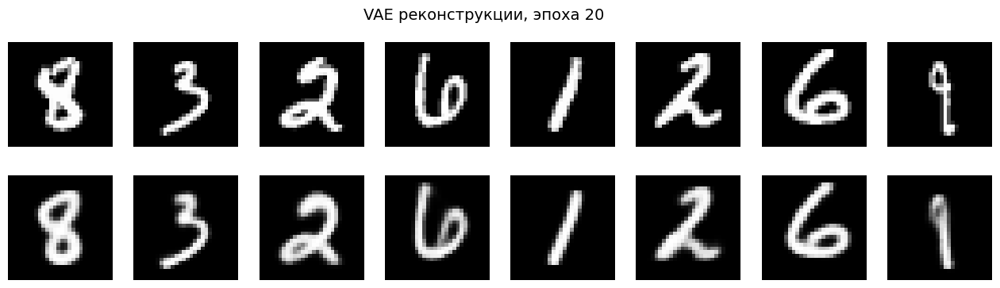

Эпоха 21/30 | Train loss: 97.295345 | Val loss: 89.516556
Эпоха 22/30 | Train loss: 97.164965 | Val loss: 89.244663
Эпоха 23/30 | Train loss: 97.087416 | Val loss: 89.644607
Эпоха 24/30 | Train loss: 97.018361 | Val loss: 89.091087
Эпоха 25/30 | Train loss: 96.946229 | Val loss: 89.325451


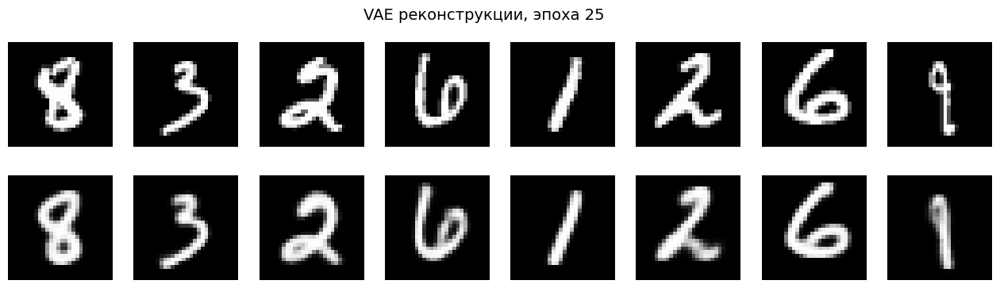

Эпоха 26/30 | Train loss: 96.850486 | Val loss: 88.818432
Эпоха 27/30 | Train loss: 96.772800 | Val loss: 89.129796
Эпоха 28/30 | Train loss: 96.664749 | Val loss: 89.378957
Эпоха 29/30 | Train loss: 96.672548 | Val loss: 89.074595
Эпоха 30/30 | Train loss: 96.579740 | Val loss: 89.098158


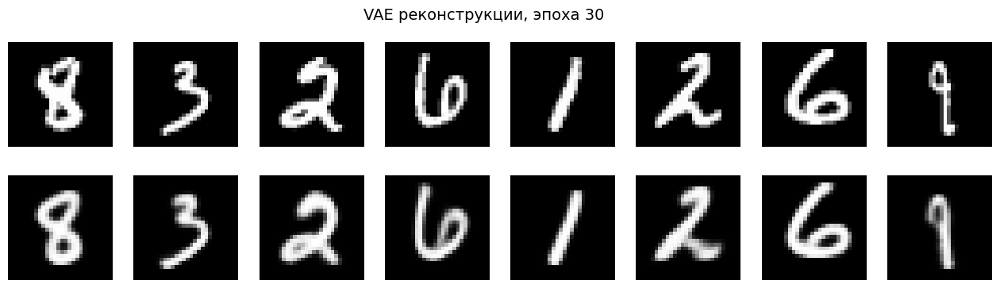

In [49]:
indices = torch.randperm(len(test_dataset))[:8]
val_samples = torch.stack([test_dataset[i][0] for i in indices]).to(device)

def show_reconstructions(model, samples, epoch):
    model.eval()
    with torch.no_grad():
        _, _, reconstruction = model(samples)
    samples = samples.cpu()
    reconstruction = reconstruction.cpu()

    fig, axes = plt.subplots(2, 8, figsize=(16, 4))
    for i in range(8):
        axes[0, i].imshow(samples[i].permute(1,2,0).squeeze(), cmap='gray')
        axes[0, i].axis('off')
        axes[1, i].imshow(reconstruction[i].permute(1,2,0).squeeze(), cmap='gray')
        axes[1, i].axis('off')
    axes[0,0].set_ylabel('Оригинал', size=12)
    axes[1,0].set_ylabel('Реконструкция', size=12)
    plt.suptitle(f'VAE реконструкции, эпоха {epoch}', fontsize=14)
    plt.show()

# Обучение
epochs = 30
for epoch in range(epochs):
    model.train()
    train_loss = 0.0
    for batch_x, _ in train_loader:
        batch_x = batch_x.to(device)
        optimizer.zero_grad()
        mu, logsigma, recon = model(batch_x)
        loss = loss_vae(batch_x, mu, logsigma, recon)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * batch_x.size(0)
    train_loss /= len(train_loader.dataset)

    # Валидация
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_x, _ in test_loader:
            batch_x = batch_x.to(device)
            mu, logsigma, recon = model(batch_x)
            loss = loss_vae(batch_x, mu, logsigma, recon)
            val_loss += loss.item() * batch_x.size(0)
    val_loss /= len(test_loader.dataset)

    print(f"Эпоха {epoch+1}/{epochs} | Train loss: {train_loss:.6f} | Val loss: {val_loss:.6f}")

    # Показываем реконструкции каждые 5 эпох
    if (epoch+1) % 5 == 0:
        show_reconstructions(model, val_samples, epoch+1)

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

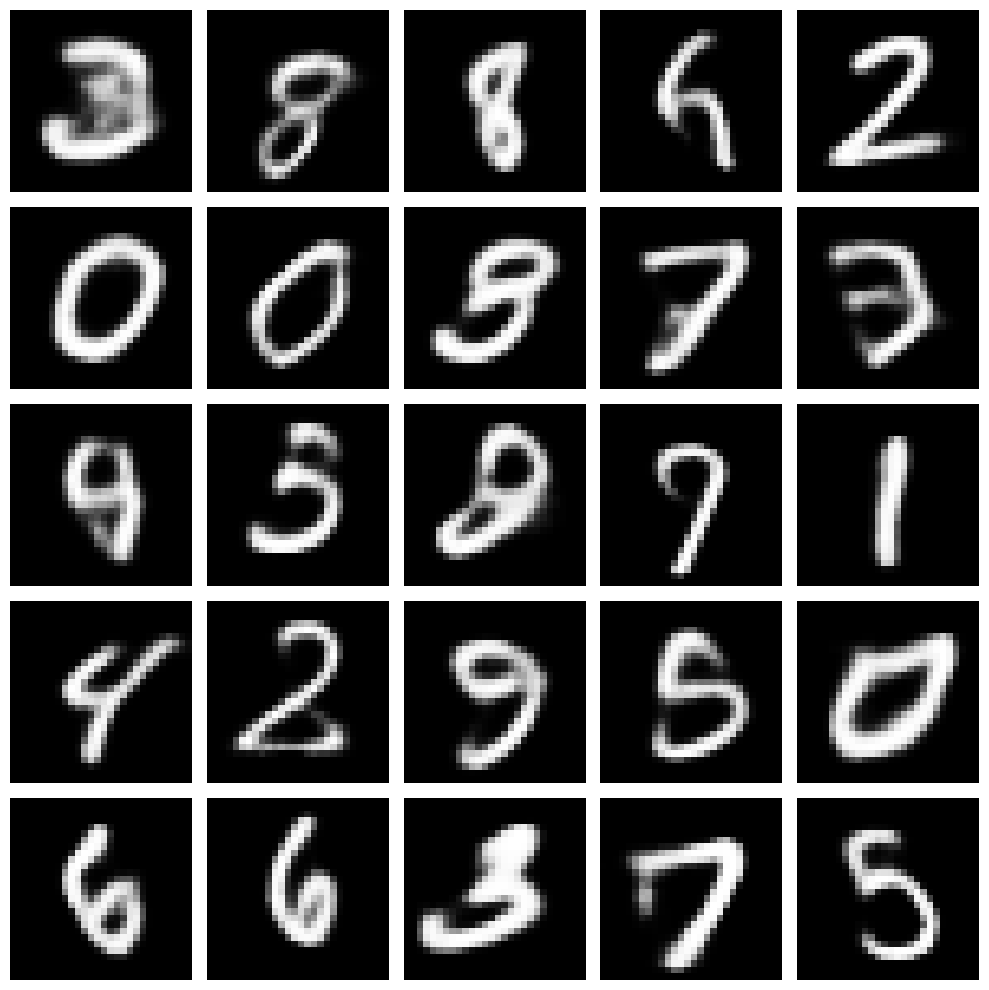

In [50]:
z_std = torch.randn(25, latent_dim).to(device)
model.eval()
with torch.no_grad():
    generated_std = model.decode(z_std)

all_mu = []
model.eval()
with torch.no_grad():
    for batch_x, _ in train_loader:
        batch_x = batch_x.to(device)
        mu, _ = model.encode(batch_x)
        all_mu.append(mu.cpu().numpy())

all_mu = np.concatenate(all_mu, axis=0)
mu_mean = all_mu.mean(axis=0)
mu_std = all_mu.std(axis=0)

z = np.random.randn(25, latent_dim).astype('float32') * mu_std + mu_mean
z_tensor = torch.tensor(z).to(device)

model.eval()
with torch.no_grad():
    generated = model.decode(z_tensor)

generated_np = generated.cpu().permute(0, 2, 3, 1).numpy()

fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated_np[i].squeeze(), cmap='gray')
    ax.axis('off')
plt.tight_layout()
plt.show()

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок лиц выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве.

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве.

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

In [52]:
from sklearn.manifold import TSNE

Собрано 10000 латентных векторов размерности 20


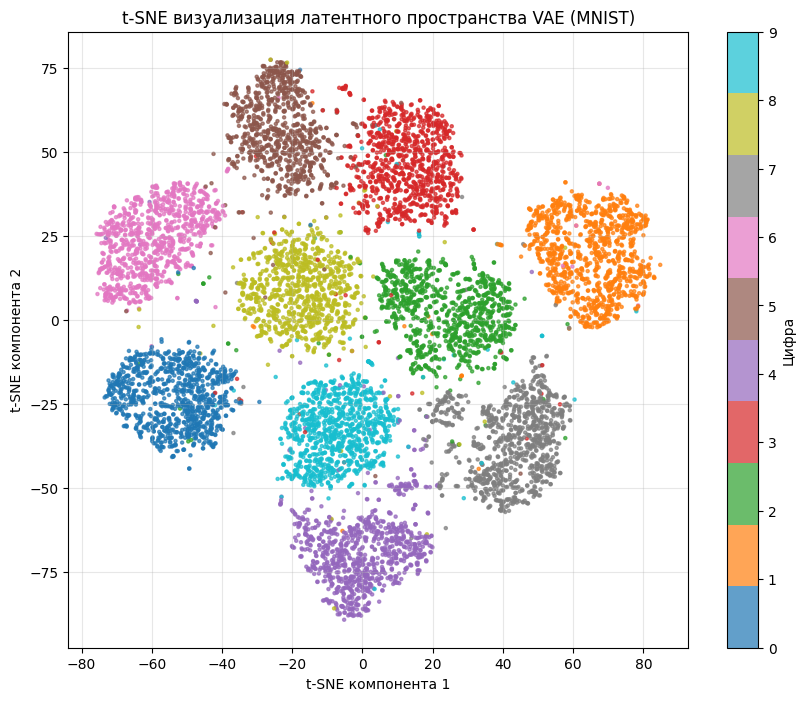

In [53]:
latent_vectors = []
labels = []

model.eval()
with torch.no_grad():
    for batch_x, batch_y in test_loader:
        batch_x = batch_x.to(device)
        mu, _ = model.encode(batch_x)
        latent_vectors.append(mu.cpu().numpy())
        labels.append(batch_y.numpy())

latent_vectors = np.concatenate(latent_vectors, axis=0)
labels = np.concatenate(labels, axis=0)

print(f"Собрано {len(latent_vectors)} латентных векторов размерности {latent_vectors.shape[1]}")

# t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
latent_2d = tsne.fit_transform(latent_vectors)

# Визуализация
plt.figure(figsize=(10, 8))
scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], 
                      c=labels, cmap='tab10', s=5, alpha=0.7)
plt.colorbar(scatter, ticks=range(10), label='Цифра')
plt.title('t-SNE визуализация латентного пространства VAE (MNIST)')
plt.xlabel('t-SNE компонента 1')
plt.ylabel('t-SNE компонента 2')
plt.grid(alpha=0.3)
plt.show()

Что вы думаете о виде латентного представления?

#### На графике образуются кластеры, соответствующие разным цифрам. Хорошо обученный VAE показывает чёткое разделение классов и плавные переходы между ними - это и есть главная особенность латентного представления.

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер.
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица).
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки.

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

In [54]:
class CVAE(nn.Module):
    def __init__(self, latent_dim=20, num_classes=10):
        super().__init__()
        self.latent_dim = latent_dim
        self.num_classes = num_classes

        # Энкодер
        self.encoder_conv = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten()
        )
        self.fc_mu = nn.Linear(2048 + num_classes, latent_dim)
        self.fc_logsigma = nn.Linear(2048 + num_classes, latent_dim)

        # Декодер
        self.decoder_fc = nn.Linear(latent_dim + num_classes, 128 * 4 * 4)
        self.decoder_conv = nn.Sequential(
            nn.Unflatten(1, (128, 4, 4)),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def encode(self, x, class_num):
        h = self.encoder_conv(x) 
        class_onehot = F.one_hot(class_num, num_classes=self.num_classes).float().to(x.device)
        h = torch.cat([h, class_onehot], dim=1)
        mu = self.fc_mu(h)
        logsigma = self.fc_logsigma(h)
        return mu, logsigma, class_num

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            sigma = torch.exp(logsigma)
            eps = torch.randn_like(mu)
            return mu + sigma * eps
        else:
            return mu

    def decode(self, z, class_num):
        class_onehot = F.one_hot(class_num, num_classes=self.num_classes).float().to(z.device)
        z_cond = torch.cat([z, class_onehot], dim=1)
        h = self.decoder_fc(z_cond)
        reconstruction = self.decoder_conv(h)
        return reconstruction

    def forward(self, x, class_num):
        mu, logsigma, class_num = self.encode(x, class_num)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z, class_num)
        return mu, logsigma, reconstruction

In [55]:
model = CVAE(latent_dim=latent_dim, num_classes=10).to(device)
optimizer = optim.AdamW(model.parameters(), lr=1e-3)

Эпоха  1/30 | Train loss: 124.3344 | Val loss: 94.6548
Эпоха  2/30 | Train loss: 101.8748 | Val loss: 91.6600
Эпоха  3/30 | Train loss: 99.2720 | Val loss: 89.7272
Эпоха  4/30 | Train loss: 97.8834 | Val loss: 89.2832
Эпоха  5/30 | Train loss: 96.9129 | Val loss: 88.4254
Эпоха  6/30 | Train loss: 96.2037 | Val loss: 87.8900
Эпоха  7/30 | Train loss: 95.6578 | Val loss: 87.2420
Эпоха  8/30 | Train loss: 95.2287 | Val loss: 87.1747
Эпоха  9/30 | Train loss: 94.8563 | Val loss: 86.7697
Эпоха 10/30 | Train loss: 94.5437 | Val loss: 86.4388


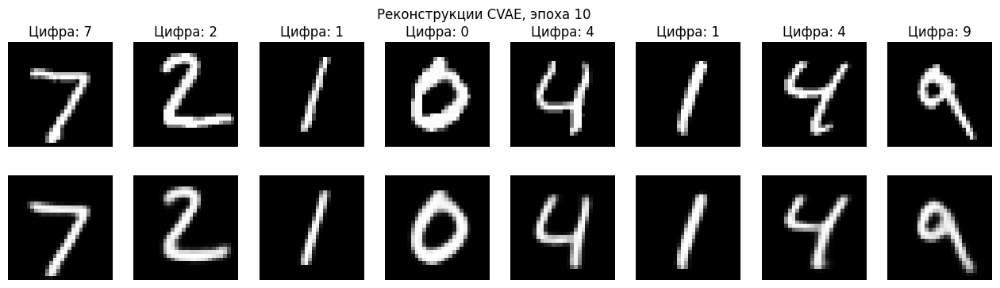

Эпоха 11/30 | Train loss: 94.2523 | Val loss: 86.6669
Эпоха 12/30 | Train loss: 94.0433 | Val loss: 87.0774
Эпоха 13/30 | Train loss: 93.8266 | Val loss: 86.7341
Эпоха 14/30 | Train loss: 93.6314 | Val loss: 86.9162
Эпоха 15/30 | Train loss: 93.4683 | Val loss: 85.7022
Эпоха 16/30 | Train loss: 93.3312 | Val loss: 85.4688
Эпоха 17/30 | Train loss: 93.1376 | Val loss: 85.6449
Эпоха 18/30 | Train loss: 93.0121 | Val loss: 85.3455
Эпоха 19/30 | Train loss: 92.9277 | Val loss: 85.6734
Эпоха 20/30 | Train loss: 92.8097 | Val loss: 85.4765


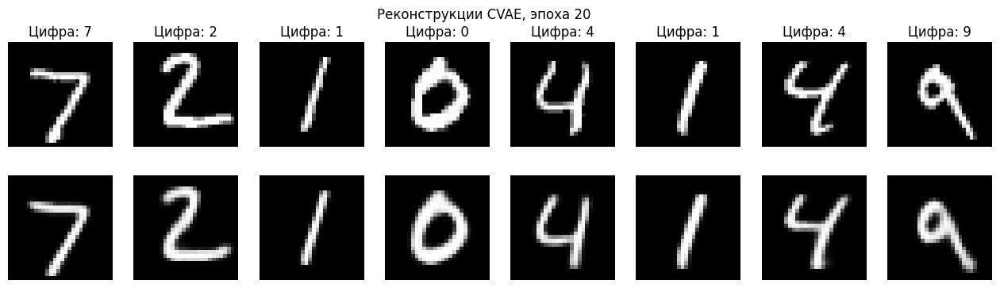

Эпоха 21/30 | Train loss: 92.7274 | Val loss: 85.6142
Эпоха 22/30 | Train loss: 92.6167 | Val loss: 85.1950
Эпоха 23/30 | Train loss: 92.5231 | Val loss: 85.1392
Эпоха 24/30 | Train loss: 92.4712 | Val loss: 85.3858
Эпоха 25/30 | Train loss: 92.3544 | Val loss: 84.7892
Эпоха 26/30 | Train loss: 92.2904 | Val loss: 85.3252
Эпоха 27/30 | Train loss: 92.2055 | Val loss: 84.8376
Эпоха 28/30 | Train loss: 92.1739 | Val loss: 85.2210
Эпоха 29/30 | Train loss: 92.0779 | Val loss: 85.5018
Эпоха 30/30 | Train loss: 92.0263 | Val loss: 85.4137


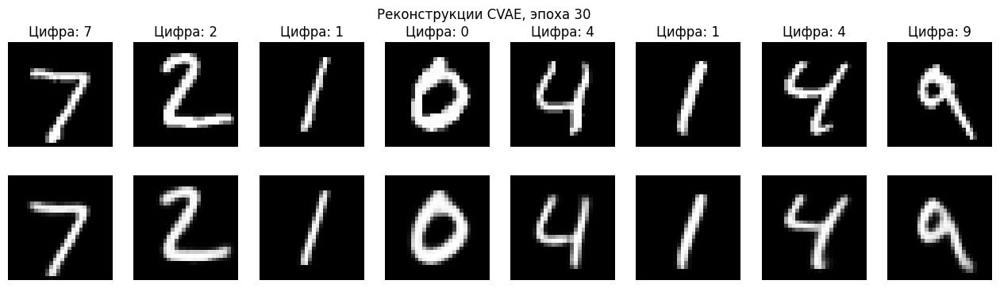

In [56]:
epochs = 30
for epoch in range(epochs):
    model.train()
    train_loss = 0.0
    for batch_x, batch_y in train_loader:
        batch_x, batch_y = batch_x.to(device), batch_y.to(device)
        optimizer.zero_grad()
        mu, logsigma, recon = model(batch_x, batch_y)
        loss = loss_vae(batch_x, mu, logsigma, recon)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * batch_x.size(0)
    train_loss /= len(train_loader.dataset)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_x, batch_y in test_loader:
            batch_x, batch_y = batch_x.to(device), batch_y.to(device)
            mu, logsigma, recon = model(batch_x, batch_y)
            loss = loss_vae(batch_x, mu, logsigma, recon)
            val_loss += loss.item() * batch_x.size(0)
    val_loss /= len(test_loader.dataset)

    print(f"Эпоха {epoch+1:2d}/{epochs} | Train loss: {train_loss:.4f} | Val loss: {val_loss:.4f}")

    if (epoch+1) % 10 == 0:
        test_batch_x, test_batch_y = next(iter(test_loader))
        test_batch_x, test_batch_y = test_batch_x[:8].to(device), test_batch_y[:8].to(device)
        model.eval()
        with torch.no_grad():
            _, _, recon = model(test_batch_x, test_batch_y)

        # Визуализация
        fig, axes = plt.subplots(2, 8, figsize=(16, 4))
        for i in range(8):
            axes[0, i].imshow(test_batch_x[i].cpu().squeeze(), cmap='gray')
            axes[0, i].set_title(f"Цифра: {test_batch_y[i].item()}")
            axes[0, i].axis('off')
            axes[1, i].imshow(recon[i].cpu().squeeze(), cmap='gray')
            axes[1, i].axis('off')
        axes[0,0].set_ylabel('Оригинал')
        axes[1,0].set_ylabel('Реконструкция')
        plt.suptitle(f'Реконструкции CVAE, эпоха {epoch+1}')
        plt.show()

### Sampling


Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

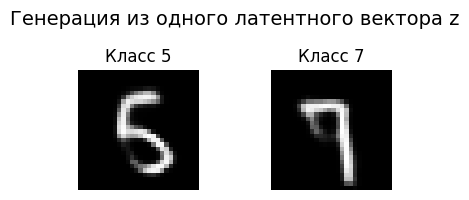

In [58]:
model.eval()

# Фиксируем один случайный латентный вектор из N(0, I)
torch.manual_seed(42)
z_fixed = torch.randn(1, latent_dim).to(device)

classes = [5, 7]

# Генерируем изображения
generated_images = []
with torch.no_grad():
    for cls in classes:
        class_tensor = torch.tensor([cls]).to(device)
        reconstruction = model.decode(z_fixed, class_tensor)
        generated_images.append(reconstruction.cpu().squeeze())

# Визуализация
fig, axes = plt.subplots(1, len(classes), figsize=(2*len(classes), 2))
for i, (img, cls) in enumerate(zip(generated_images, classes)):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f'Класс {cls}')
    axes[i].axis('off')
plt.suptitle('Генерация из одного латентного вектора z', fontsize=14)
plt.tight_layout()
plt.show()

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.

Собрано 10000 латентных векторов размерности 20


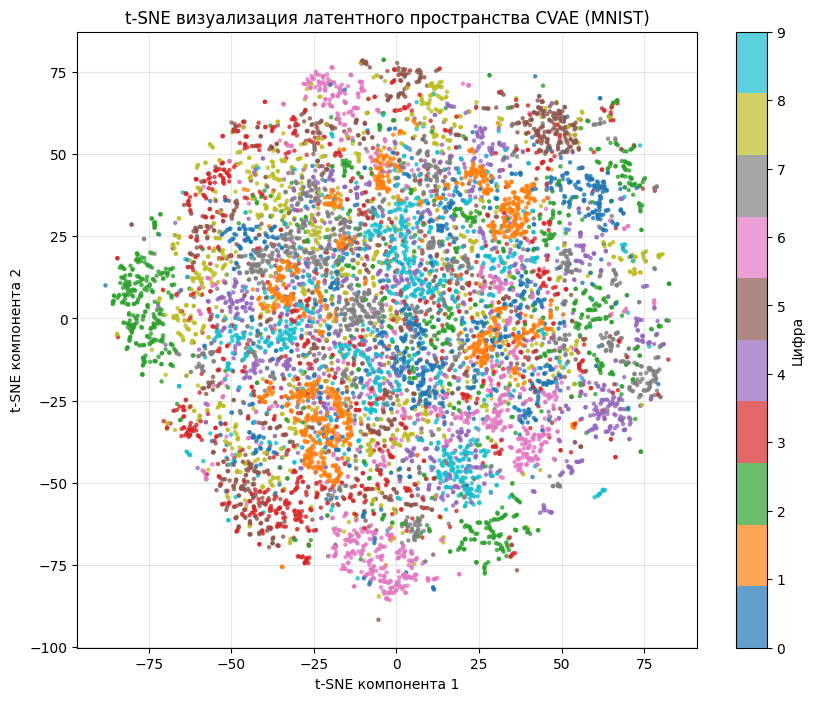

In [59]:
latent_vectors = []
labels = []

model.eval()
with torch.no_grad():
    for batch_x, batch_y in test_loader:
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)
        mu, _, _ = model.encode(batch_x, batch_y)
        latent_vectors.append(mu.cpu().numpy())
        labels.append(batch_y.cpu().numpy())

latent_vectors = np.concatenate(latent_vectors, axis=0)
labels = np.concatenate(labels, axis=0)

print(f"Собрано {len(latent_vectors)} латентных векторов размерности {latent_vectors.shape[1]}")

from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
latent_2d = tsne.fit_transform(latent_vectors)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], 
                      c=labels, cmap='tab10', s=5, alpha=0.7)
plt.colorbar(scatter, ticks=range(10), label='Цифра')
plt.title('t-SNE визуализация латентного пространства CVAE (MNIST)')
plt.xlabel('t-SNE компонента 1')
plt.ylabel('t-SNE компонента 2')
plt.grid(alpha=0.3)
plt.show()

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?


#### В обычном VAE латентный вектор вынужден хранить всю информацию об изображении, включая класс цифры. Поэтому при визуализации t-SNE мы видим чёткие кластеры: модель сама придумала группировать похожие цифры, чтобы лучше их реконструировать.

#### В CVAE всё иначе: метка класса подаётся явно и в энкодер, и в декодер, модель это понимает и латентный вектор начинает кодировать только вариации стиля, не зависящие от класса: наклон, толщину, шум. Следовательно, в латентном пространстве точки разных классов перемешиваются, и t-SNE показывает один большой общий кластер.


# BONUS 1: Denoising (2 балла)



У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума.
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом.

In [63]:
from torch.utils.data import Dataset

Эпоха  1/20 | Train loss: 0.031797 | Val loss: 0.026295
Эпоха  2/20 | Train loss: 0.016831 | Val loss: 0.012996
Эпоха  3/20 | Train loss: 0.011554 | Val loss: 0.010945
Эпоха  4/20 | Train loss: 0.010053 | Val loss: 0.009864
Эпоха  5/20 | Train loss: 0.009253 | Val loss: 0.009183
Эпоха  6/20 | Train loss: 0.008695 | Val loss: 0.008832
Эпоха  7/20 | Train loss: 0.008290 | Val loss: 0.008301
Эпоха  8/20 | Train loss: 0.007961 | Val loss: 0.007990
Эпоха  9/20 | Train loss: 0.007665 | Val loss: 0.007698
Эпоха 10/20 | Train loss: 0.007487 | Val loss: 0.008207
Эпоха 11/20 | Train loss: 0.007362 | Val loss: 0.007343
Эпоха 12/20 | Train loss: 0.007070 | Val loss: 0.007330
Эпоха 13/20 | Train loss: 0.007017 | Val loss: 0.007362
Эпоха 14/20 | Train loss: 0.006781 | Val loss: 0.007456
Эпоха 15/20 | Train loss: 0.006764 | Val loss: 0.006841
Эпоха 16/20 | Train loss: 0.006616 | Val loss: 0.006787
Эпоха 17/20 | Train loss: 0.006503 | Val loss: 0.006900
Эпоха 18/20 | Train loss: 0.006545 | Val loss: 0

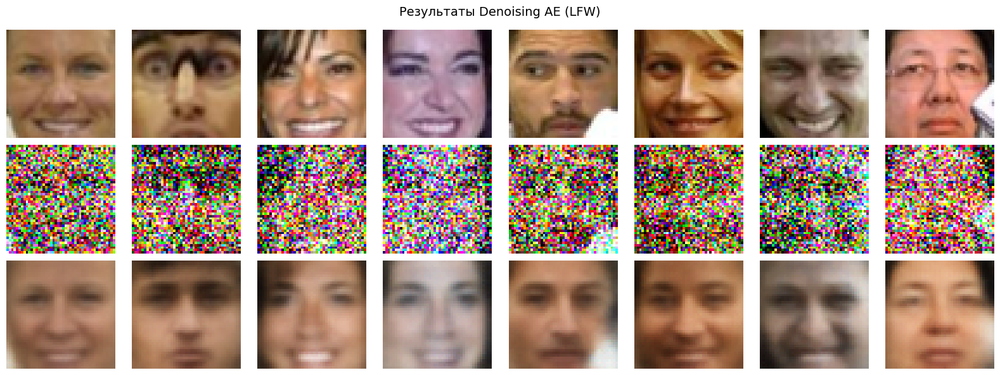

In [64]:
class FaceDataset(Dataset):
    def __init__(self, images):
        self.images = images

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        img = torch.from_numpy(img).permute(2,0,1) 
        img = img.float() / 255.0
        return img

images_train, images_val = train_test_split(images, test_size=0.2, random_state=42)

train_dataset = FaceDataset(images_train)
val_dataset = FaceDataset(images_val)

batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

def add_noise(images, noise_factor=0.5):
    noise = noise_factor * torch.randn_like(images)
    noisy = images + noise
    noisy = torch.clamp(noisy, 0.0, 1.0)
    return noisy

model = Autoencoder(code_dim=128).to(device)
criterion = nn.MSELoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-3)

epochs = 20
noise_factor = 0.5

for epoch in range(epochs):
    model.train()
    train_loss = 0.0
    for batch_x in train_loader:
        batch_x = batch_x.to(device)
        noisy_x = add_noise(batch_x, noise_factor)
        optimizer.zero_grad()
        output, _ = model(noisy_x)
        loss = criterion(output, batch_x)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * batch_x.size(0)
    train_loss /= len(train_loader.dataset)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_x in val_loader:
            batch_x = batch_x.to(device)
            noisy_x = add_noise(batch_x, noise_factor)
            output, _ = model(noisy_x)
            loss = criterion(output, batch_x)
            val_loss += loss.item() * batch_x.size(0)
    val_loss /= len(val_loader.dataset)

    print(f"Эпоха {epoch+1:2d}/{epochs} | Train loss: {train_loss:.6f} | Val loss: {val_loss:.6f}")

model.eval()
# Возьмём несколько изображений из валидации
val_iter = iter(val_loader)
sample_clean = next(val_iter)[:8].to(device)
sample_noisy = add_noise(sample_clean, noise_factor)

with torch.no_grad():
    sample_denoised, _ = model(sample_noisy)

# Визуализация
fig, axes = plt.subplots(3, 8, figsize=(16, 6))
for i in range(8):
    axes[0, i].imshow(sample_clean[i].cpu().permute(1,2,0).numpy())
    axes[0, i].axis('off')
    axes[1, i].imshow(sample_noisy[i].cpu().permute(1,2,0).numpy())
    axes[1, i].axis('off')
    axes[2, i].imshow(sample_denoised[i].cpu().permute(1,2,0).numpy())
    axes[2, i].axis('off')
axes[0,0].set_ylabel('Оригинал')
axes[1,0].set_ylabel('Зашумлено')
axes[2,0].set_ylabel('Восстановлено')
plt.suptitle('Результаты Denoising AE (LFW)', fontsize=14)
plt.tight_layout()
plt.show()

# BONUS 2: Image Retrieval (2 балла)



Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентных представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

In [78]:
class FaceDataset(Dataset):
    def __init__(self, images):
        self.images = images
    def __len__(self):
        return len(self.images)
    def __getitem__(self, idx):
        img = torch.from_numpy(self.images[idx]).permute(2,0,1).float() / 255.0
        return img

images_train, images_test = train_test_split(images, test_size=0.2, random_state=42)
train_dataset = FaceDataset(images_train)
test_dataset  = FaceDataset(images_test)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=128, shuffle=False)

ae = Autoencoder(code_dim=128).to(device)
optimizer = optim.AdamW(ae.parameters(), lr=1e-3)
criterion = nn.MSELoss()

In [79]:
epochs = 20
for epoch in range(epochs):
    ae.train()
    train_loss = 0.0
    for batch_x in train_loader:
        batch_x = batch_x.to(device)
        optimizer.zero_grad()
        recon, _ = ae(batch_x)
        loss = criterion(recon, batch_x)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * batch_x.size(0)
    train_loss /= len(train_loader.dataset)
    ae.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_x in test_loader:
            batch_x = batch_x.to(device)
            recon, _ = ae(batch_x)
            val_loss += criterion(recon, batch_x).item() * batch_x.size(0)
    val_loss /= len(test_loader.dataset)
    print(f"Эпоха {epoch+1:2d} | Train: {train_loss:.6f} | Val: {val_loss:.6f}")

Эпоха  1 | Train: 0.028884 | Val: 0.015809
Эпоха  2 | Train: 0.012354 | Val: 0.010060
Эпоха  3 | Train: 0.009080 | Val: 0.008554
Эпоха  4 | Train: 0.007898 | Val: 0.007890
Эпоха  5 | Train: 0.007180 | Val: 0.006858
Эпоха  6 | Train: 0.006483 | Val: 0.006340
Эпоха  7 | Train: 0.006065 | Val: 0.006073
Эпоха  8 | Train: 0.005722 | Val: 0.005598
Эпоха  9 | Train: 0.005525 | Val: 0.005715
Эпоха 10 | Train: 0.005305 | Val: 0.005298
Эпоха 11 | Train: 0.005111 | Val: 0.005142
Эпоха 12 | Train: 0.004955 | Val: 0.005013
Эпоха 13 | Train: 0.004874 | Val: 0.005219
Эпоха 14 | Train: 0.004766 | Val: 0.004958
Эпоха 15 | Train: 0.004723 | Val: 0.004975
Эпоха 16 | Train: 0.004635 | Val: 0.004730
Эпоха 17 | Train: 0.004572 | Val: 0.004640
Эпоха 18 | Train: 0.004497 | Val: 0.004799
Эпоха 19 | Train: 0.004462 | Val: 0.004544
Эпоха 20 | Train: 0.004402 | Val: 0.004577


In [96]:
from sklearn.neighbors import NearestNeighbors

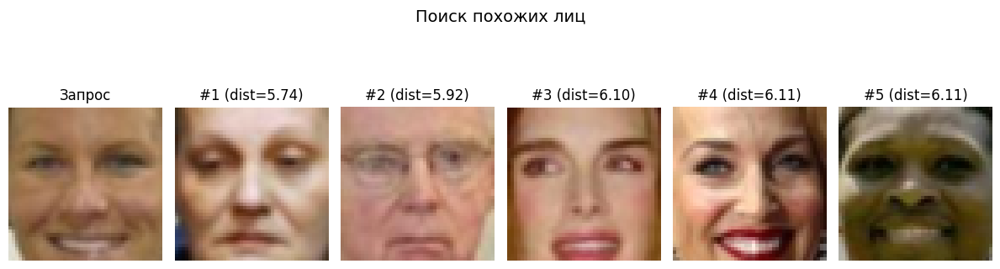

In [100]:
ae.eval()
train_latents = []
with torch.no_grad():
    for batch_x in train_loader:
        batch_x = batch_x.to(device)
        _, latent = ae(batch_x)
        train_latents.append(latent.cpu().numpy())
train_latents = np.concatenate(train_latents, axis=0)

nbrs = NearestNeighbors(n_neighbors=5, algorithm='auto').fit(train_latents)

# Тестовый запрос
query_img = images_test[0]
query_tensor = torch.from_numpy(query_img).permute(2,0,1).unsqueeze(0).float().to(device) / 255.0
with torch.no_grad():
    _, query_latent = ae(query_tensor)
query_latent = query_latent.cpu().numpy()

distances, indices = nbrs.kneighbors(query_latent, n_neighbors=5)

# Визуализация
plt.figure(figsize=(12, 4))
plt.subplot(1, 6, 1)
plt.imshow(query_img.astype('uint8'))
plt.title('Запрос')
plt.axis('off')

for i, (idx, dist) in enumerate(zip(indices[0], distances[0])):
    plt.subplot(1, 6, i+2)
    plt.imshow(images_train[idx].astype('uint8'))
    plt.title(f'#{i+1} (dist={dist:.2f})')
    plt.axis('off')

plt.suptitle('Поиск похожих лиц', fontsize=14)
plt.tight_layout()
plt.show()